In [1]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import random
import math
from scipy.fftpack import dct, idct

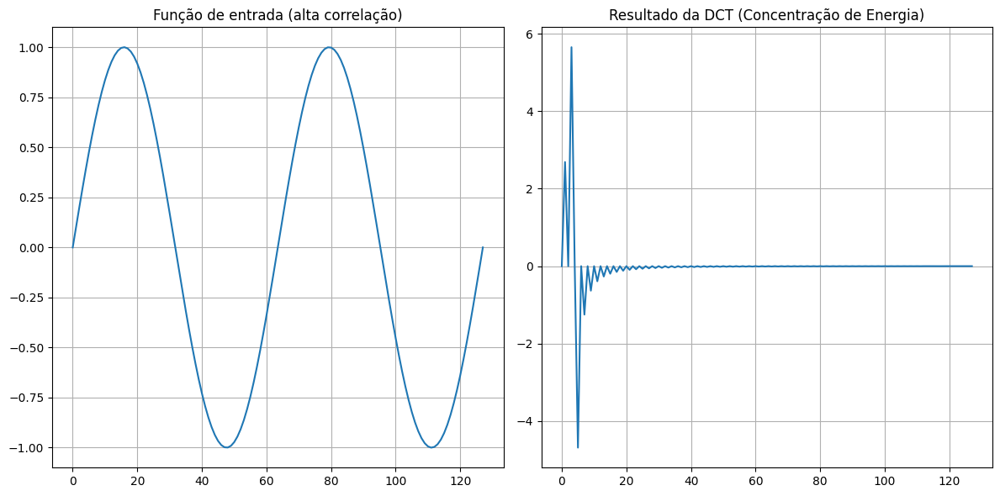

In [2]:
# Criando um vetor de entrada com alta correlação (senoidal)
x = np.sin(np.linspace(0, 4 * np.pi, 128))

# Aplicação da Transformada Discreta do Cosseno (DCT) unidimensional
dct_result = dct(x, norm='ortho')

# Plotando a função de entrada e a transformada
plt.figure(figsize=(12, 6))

# Função de entrada (com alta correlação)
plt.subplot(1, 2, 1)
plt.plot(x)
plt.title('Função de entrada (alta correlação)')
plt.grid(True)

# Resultado da DCT, mostrando concentração de energia
plt.subplot(1, 2, 2)
plt.plot(dct_result)
plt.title('Resultado da DCT (Concentração de Energia)')
plt.grid(True)

plt.tight_layout()
plt.show()

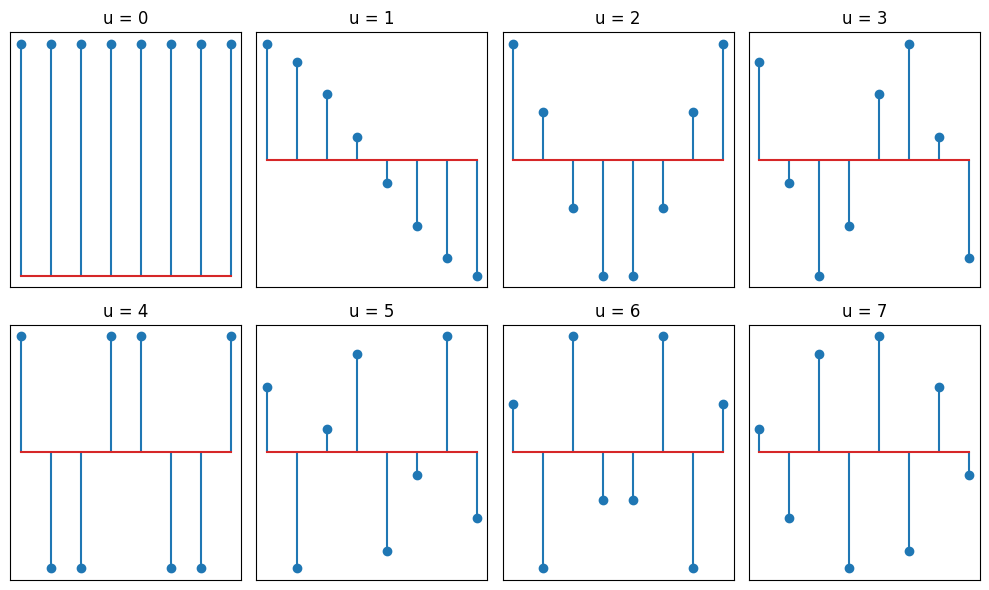

In [3]:
# Definindo o número de componentes
n = 8

# Gerar as funções de base da DCT
def dct_basis(n, u):
    return np.cos(np.pi * u * (np.arange(n) + 0.5) / n)

# Criar a figura
plt.figure(figsize=(10, 6))

# Plotar as funções de base para cada u de 0 a 7
for u in range(n):
    plt.subplot(2, 4, u + 1)
    plt.stem(dct_basis(n, u))  # Removido o argumento 'use_line_collection'
    plt.title(f'u = {u}')
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()
plt.show()

DCT

(512, 512)


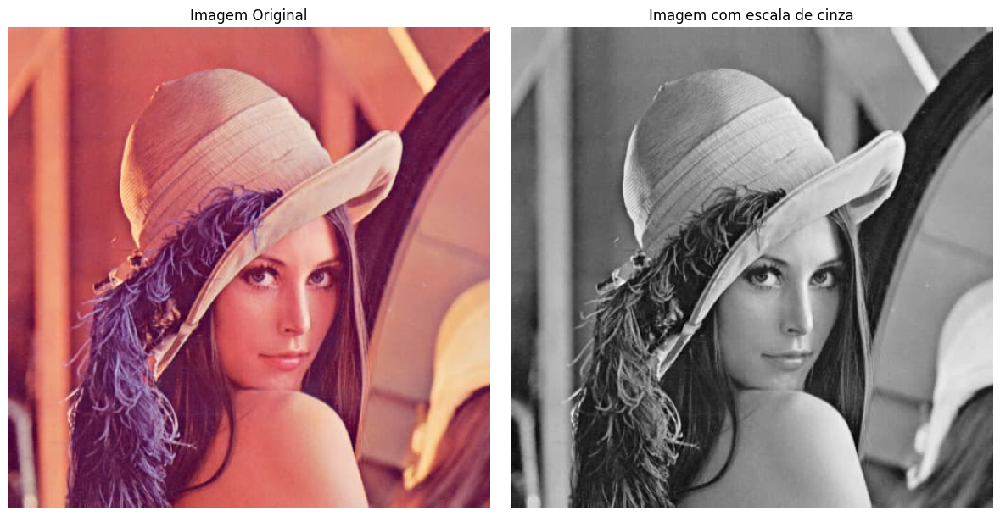

In [4]:
imagem_original = Image.open('lenna.jpg')
imagem_cinza = imagem_original.convert('L')
matriz_imagem = np.array(imagem_cinza)

print(matriz_imagem.shape)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(imagem_original, cmap='gray')
plt.title('Imagem Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(imagem_cinza, cmap='gray')
plt.title('Imagem com escala de cinza')
plt.axis('off')

plt.tight_layout()
plt.show()

In [5]:
# Função para aplicar DCT 2D
def dct2(block):
    return dct(dct(block.T, norm='ortho').T, norm='ortho')

In [6]:
# Dividir a imagem em blocos de 64x64
h, w = matriz_imagem.shape
bloco_tamanho = 64
dct_result = np.zeros_like(matriz_imagem, dtype=np.float32)


In [7]:
for i in range(0, h, bloco_tamanho):
    for j in range(0, w, bloco_tamanho):
        # Extrair o bloco 64x64
        bloco = matriz_imagem[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
        # Aplicar a DCT no bloco
        dct_bloco = dct2(bloco.astype(np.float32))
        
        # Salvar o resultado da DCT no local correspondente
        dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho] = dct_bloco
        
        print(f"Processado bloco em ({i},{j})")

Processado bloco em (0,0)
Processado bloco em (0,64)
Processado bloco em (0,128)
Processado bloco em (0,192)
Processado bloco em (0,256)
Processado bloco em (0,320)
Processado bloco em (0,384)
Processado bloco em (0,448)
Processado bloco em (64,0)
Processado bloco em (64,64)
Processado bloco em (64,128)
Processado bloco em (64,192)
Processado bloco em (64,256)
Processado bloco em (64,320)
Processado bloco em (64,384)
Processado bloco em (64,448)
Processado bloco em (128,0)
Processado bloco em (128,64)
Processado bloco em (128,128)
Processado bloco em (128,192)
Processado bloco em (128,256)
Processado bloco em (128,320)
Processado bloco em (128,384)
Processado bloco em (128,448)
Processado bloco em (192,0)
Processado bloco em (192,64)
Processado bloco em (192,128)
Processado bloco em (192,192)
Processado bloco em (192,256)
Processado bloco em (192,320)
Processado bloco em (192,384)
Processado bloco em (192,448)
Processado bloco em (256,0)
Processado bloco em (256,64)
Processado bloco em

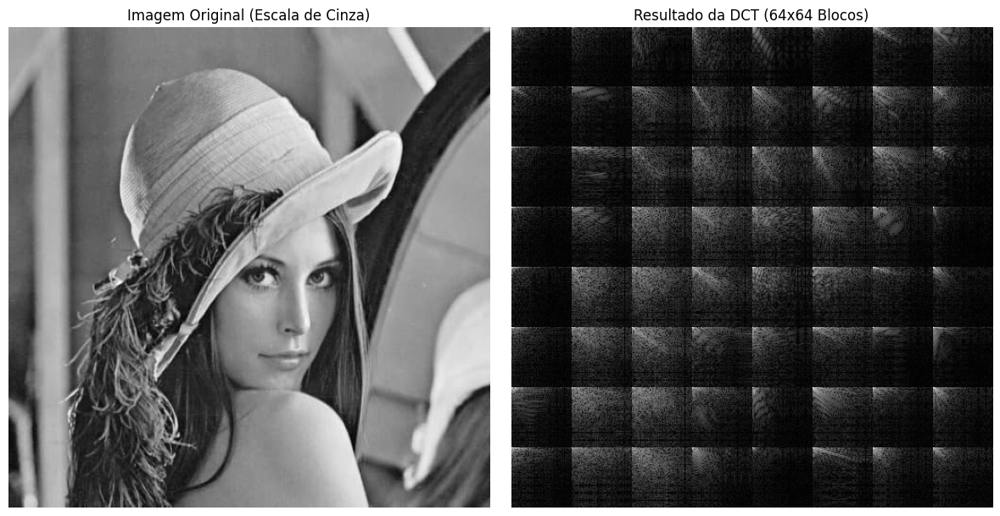

In [8]:
# Visualizar a imagem original e o resultado da DCT
plt.figure(figsize=(12, 6))

# A - Imagem original
plt.subplot(1, 2, 1)
plt.imshow(imagem_cinza, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - Resultado da DCT
plt.subplot(1, 2, 2)
plt.imshow(np.log(np.abs(dct_result) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('Resultado da DCT (64x64 Blocos)')
plt.axis('off')

plt.tight_layout()
plt.show()

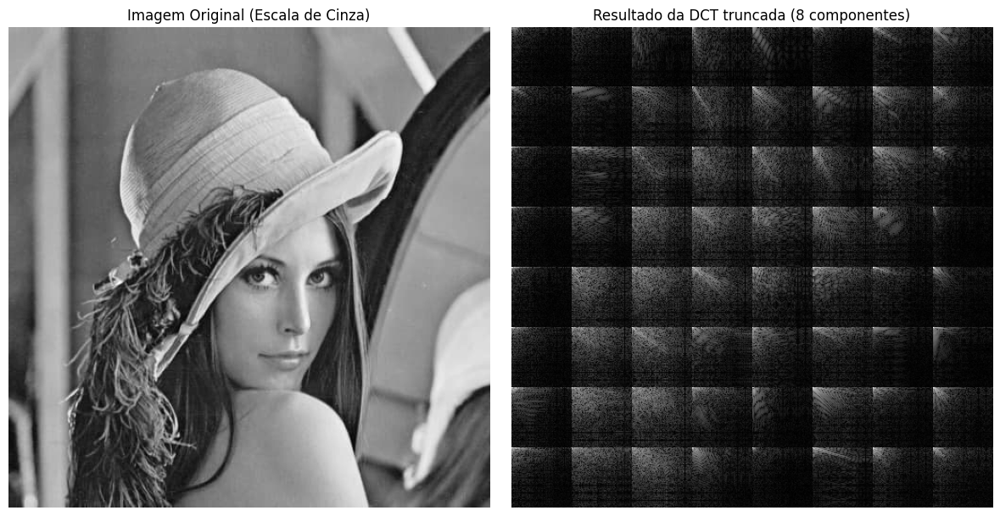

In [9]:
# Função para truncar a DCT para os 8 primeiros coeficientes
def truncar_dct_para_8_componentes(dct_bloco, num_componentes=8):
    bloco_truncado = np.zeros_like(dct_bloco)
    # Preservar os primeiros 8 coeficientes (num_componentes x num_componentes)
    bloco_truncado[:num_componentes, :num_componentes] = dct_bloco[:num_componentes, :num_componentes]
    return bloco_truncado

# Modificar o loop para truncar os coeficientes
# for i in range(0, h, bloco_tamanho):
#     for j in range(0, w, bloco_tamanho):
#         # Extrair o bloco 64x64
#         bloco = matriz_imagem[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
#         # Aplicar a DCT no bloco
#         dct_bloco = dct2(bloco.astype(np.float32))
        
#         # Truncar os coeficientes da DCT para os 8 primeiros
#         dct_truncado = truncar_dct_para_8_componentes(dct_bloco)
        
#         # Salvar o resultado da DCT truncada no local correspondente
#         dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho] = dct_truncado
        
#         print(f"Processado bloco em ({i},{j}) com truncagem para 8 componentes") 

# Visualizar a imagem original e o resultado da DCT truncada
plt.figure(figsize=(12, 6))

# A - Imagem original
plt.subplot(1, 2, 1)
plt.imshow(imagem_cinza, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - Resultado da DCT truncada
plt.subplot(1, 2, 2)
plt.imshow(np.log(np.abs(dct_result) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('Resultado da DCT truncada (8 componentes)')
plt.axis('off')

plt.tight_layout()
plt.show()


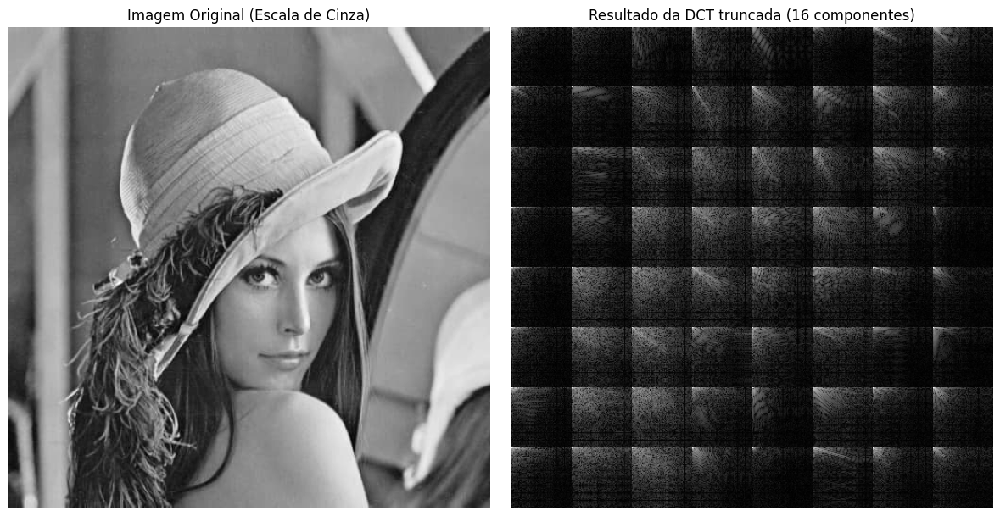

In [10]:
# Função para truncar a DCT para os 8 primeiros coeficientes
def truncar_dct_para_8_componentes(dct_bloco, num_componentes=16):
    bloco_truncado = np.zeros_like(dct_bloco)
    # Preservar os primeiros 8 coeficientes (num_componentes x num_componentes)
    bloco_truncado[:num_componentes, :num_componentes] = dct_bloco[:num_componentes, :num_componentes]
    return bloco_truncado

# Modificar o loop para truncar os coeficientes
# for i in range(0, h, bloco_tamanho):
#     for j in range(0, w, bloco_tamanho):
#         # Extrair o bloco 64x64
#         bloco = matriz_imagem[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
#         # Aplicar a DCT no bloco
#         dct_bloco = dct2(bloco.astype(np.float32))
        
#         # Truncar os coeficientes da DCT para os 8 primeiros
#         dct_truncado = truncar_dct_para_8_componentes(dct_bloco)
        
#         # Salvar o resultado da DCT truncada no local correspondente
#         dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho] = dct_truncado
        
#         print(f"Processado bloco em ({i},{j}) com truncagem para 8 componentes") 

# Visualizar a imagem original e o resultado da DCT truncada
plt.figure(figsize=(12, 6))

# A - Imagem original
plt.subplot(1, 2, 1)
plt.imshow(imagem_cinza, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - Resultado da DCT truncada
plt.subplot(1, 2, 2)
plt.imshow(np.log(np.abs(dct_result) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('Resultado da DCT truncada (16 componentes)')
plt.axis('off')

plt.tight_layout()
plt.show()


Processado bloco em (0,0) com truncagem para 16 componentes
Processado bloco em (0,64) com truncagem para 16 componentes
Processado bloco em (0,128) com truncagem para 16 componentes
Processado bloco em (0,192) com truncagem para 16 componentes
Processado bloco em (0,256) com truncagem para 16 componentes
Processado bloco em (0,320) com truncagem para 16 componentes
Processado bloco em (0,384) com truncagem para 16 componentes
Processado bloco em (0,448) com truncagem para 16 componentes
Processado bloco em (64,0) com truncagem para 16 componentes
Processado bloco em (64,64) com truncagem para 16 componentes
Processado bloco em (64,128) com truncagem para 16 componentes
Processado bloco em (64,192) com truncagem para 16 componentes
Processado bloco em (64,256) com truncagem para 16 componentes
Processado bloco em (64,320) com truncagem para 16 componentes
Processado bloco em (64,384) com truncagem para 16 componentes
Processado bloco em (64,448) com truncagem para 16 componentes
Proces

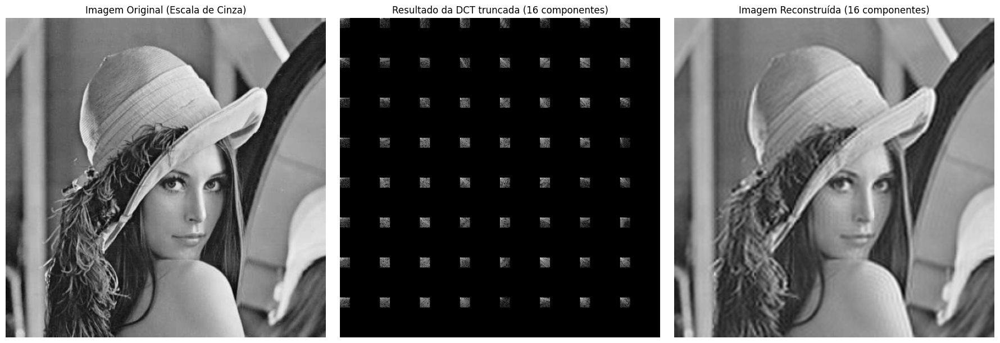

In [11]:
# Importar a função para a DCT inversa
from scipy.fftpack import idct

# Função para aplicar IDCT 2D
def idct2(block):
    return idct(idct(block.T, norm='ortho').T, norm='ortho')

# Função para truncar a DCT para os 16 primeiros coeficientes
def truncar_dct_para_16_componentes(dct_bloco, num_componentes=16):
    bloco_truncado = np.zeros_like(dct_bloco)
    # Preservar os primeiros 16 coeficientes (num_componentes x num_componentes)
    bloco_truncado[:num_componentes, :num_componentes] = dct_bloco[:num_componentes, :num_componentes]
    return bloco_truncado

# Aplicar a DCT com truncagem para 16 componentes
# for i in range(0, h, bloco_tamanho):
#     for j in range(0, w, bloco_tamanho):
#         # Extrair o bloco 64x64
#         bloco = matriz_imagem[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
#         # Aplicar a DCT no bloco
#         dct_bloco = dct2(bloco.astype(np.float32))
        
#         # Truncar os coeficientes da DCT para os 16 primeiros
#         dct_truncado = truncar_dct_para_16_componentes(dct_bloco)
        
#         # Salvar o resultado da DCT truncada no local correspondente
#         dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho] = dct_truncado
        
#         print(f"Processado bloco em ({i},{j}) com truncagem para 16 componentes")

# Agora vamos recriar a imagem a partir dos coeficientes DCT truncados usando a IDCT

# Criar uma matriz para armazenar a imagem reconstruída
imagem_reconstruida = np.zeros_like(matriz_imagem, dtype=np.float32)

# Aplicar a IDCT para cada bloco de 64x64
for i in range(0, h, bloco_tamanho):
    for j in range(0, w, bloco_tamanho):
        # Extrair o bloco 64x64 da DCT truncada
        dct_bloco = dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
        # Aplicar a IDCT para recriar o bloco de imagem
        bloco_reconstruido = idct2(dct_bloco)
        
        # Salvar o bloco reconstruído na imagem final
        imagem_reconstruida[i:i+bloco_tamanho, j:j+bloco_tamanho] = bloco_reconstruido

# Visualizar a imagem original, o resultado da DCT truncada e a imagem reconstruída
plt.figure(figsize=(18, 6))

# A - Imagem original
plt.subplot(1, 3, 1)
plt.imshow(imagem_cinza, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - Resultado da DCT truncada
plt.subplot(1, 3, 2)
plt.imshow(np.log(np.abs(dct_result) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('Resultado da DCT truncada (16 componentes)')
plt.axis('off')

# C - Imagem reconstruída a partir da DCT truncada
plt.subplot(1, 3, 3)
plt.imshow(imagem_reconstruida, cmap='gray')
plt.title('Imagem Reconstruída (16 componentes)')
plt.axis('off')

plt.tight_layout()
plt.show()


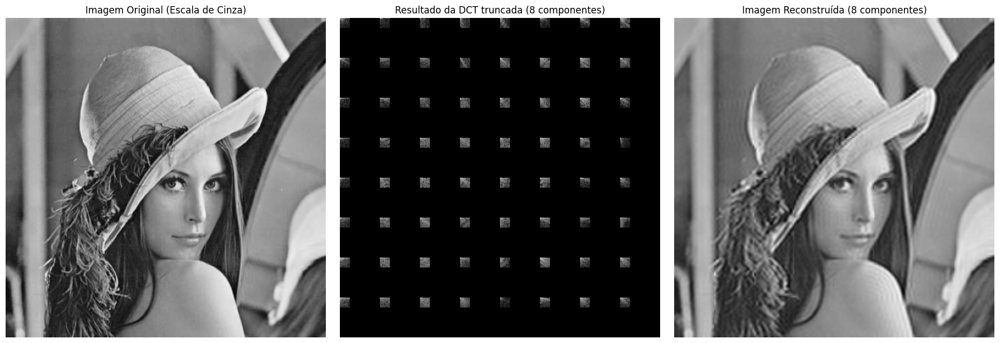

In [12]:
# Função para truncar a DCT para os 8 primeiros coeficientes
def truncar_dct_para_8_componentes(dct_bloco, num_componentes=8):
    bloco_truncado = np.zeros_like(dct_bloco)
    # Preservar os primeiros 8 coeficientes (num_componentes x num_componentes)
    bloco_truncado[:num_componentes, :num_componentes] = dct_bloco[:num_componentes, :num_componentes]
    return bloco_truncado

# Aplicar a DCT com truncagem para 8 componentes
# for i in range(0, h, bloco_tamanho):
#     for j in range(0, w, bloco_tamanho):
#         # Extrair o bloco 64x64
#         bloco = matriz_imagem[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
#         # Aplicar a DCT no bloco
#         dct_bloco = dct2(bloco.astype(np.float32))
        
#         # Truncar os coeficientes da DCT para os 8 primeiros
#         dct_truncado = truncar_dct_para_8_componentes(dct_bloco)
        
#         # Salvar o resultado da DCT truncada no local correspondente
#         dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho] = dct_truncado
        
#         print(f"Processado bloco em ({i},{j}) com truncagem para 8 componentes")

# Agora vamos recriar a imagem a partir dos coeficientes DCT truncados usando a IDCT

# Criar uma matriz para armazenar a imagem reconstruída
imagem_reconstruida = np.zeros_like(matriz_imagem, dtype=np.float32)

# Aplicar a IDCT para cada bloco de 64x64
for i in range(0, h, bloco_tamanho):
    for j in range(0, w, bloco_tamanho):
        # Extrair o bloco 64x64 da DCT truncada
        dct_bloco = dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
        # Aplicar a IDCT para recriar o bloco de imagem
        bloco_reconstruido = idct2(dct_bloco)
        
        # Salvar o bloco reconstruído na imagem final
        imagem_reconstruida[i:i+bloco_tamanho, j:j+bloco_tamanho] = bloco_reconstruido

# Visualizar a imagem original, o resultado da DCT truncada e a imagem reconstruída
plt.figure(figsize=(18, 6))

# A - Imagem original
plt.subplot(1, 3, 1)
plt.imshow(imagem_cinza, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - Resultado da DCT truncada
plt.subplot(1, 3, 2)
plt.imshow(np.log(np.abs(dct_result) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('Resultado da DCT truncada (8 componentes)')
plt.axis('off')

# C - Imagem reconstruída a partir da DCT truncada
plt.subplot(1, 3, 3)
plt.imshow(imagem_reconstruida, cmap='gray')
plt.title('Imagem Reconstruída (8 componentes)')
plt.axis('off')

plt.tight_layout()
plt.show()


Processado bloco em (0,0) com truncagem para 64 componentes
Processado bloco em (0,64) com truncagem para 64 componentes
Processado bloco em (0,128) com truncagem para 64 componentes
Processado bloco em (0,192) com truncagem para 64 componentes
Processado bloco em (0,256) com truncagem para 64 componentes
Processado bloco em (0,320) com truncagem para 64 componentes
Processado bloco em (0,384) com truncagem para 64 componentes
Processado bloco em (0,448) com truncagem para 64 componentes
Processado bloco em (64,0) com truncagem para 64 componentes
Processado bloco em (64,64) com truncagem para 64 componentes
Processado bloco em (64,128) com truncagem para 64 componentes
Processado bloco em (64,192) com truncagem para 64 componentes
Processado bloco em (64,256) com truncagem para 64 componentes
Processado bloco em (64,320) com truncagem para 64 componentes
Processado bloco em (64,384) com truncagem para 64 componentes
Processado bloco em (64,448) com truncagem para 64 componentes
Proces

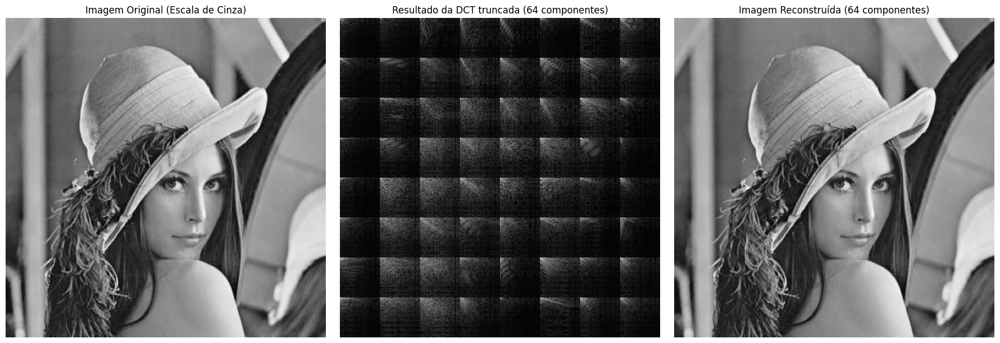

In [14]:
# Função para truncar a DCT para os 64 primeiros coeficientes
def truncar_dct_para_64_componentes(dct_bloco, num_componentes=64):
    bloco_truncado = np.zeros_like(dct_bloco)
    # Preservar os primeiros 64 coeficientes (num_componentes x num_componentes)
    bloco_truncado[:num_componentes, :num_componentes] = dct_bloco[:num_componentes, :num_componentes]
    return bloco_truncado

# Aplicar a DCT com truncagem para 64 componentes
for i in range(0, h, bloco_tamanho):
    for j in range(0, w, bloco_tamanho):
        # Extrair o bloco 64x64
        bloco = matriz_imagem[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
        # Aplicar a DCT no bloco
        dct_bloco = dct2(bloco.astype(np.float32))
        
        # Truncar os coeficientes da DCT para os 64 primeiros
        dct_truncado = truncar_dct_para_64_componentes(dct_bloco)
        
        # Salvar o resultado da DCT truncada no local correspondente
        dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho] = dct_truncado
        
        print(f"Processado bloco em ({i},{j}) com truncagem para 64 componentes")

# Agora vamos recriar a imagem a partir dos coeficientes DCT truncados usando a IDCT

# Criar uma matriz para armazenar a imagem reconstruída
imagem_reconstruida = np.zeros_like(matriz_imagem, dtype=np.float32)

# Aplicar a IDCT para cada bloco de 64x64
for i in range(0, h, bloco_tamanho):
    for j in range(0, w, bloco_tamanho):
        # Extrair o bloco 64x64 da DCT truncada
        dct_bloco = dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
        # Aplicar a IDCT para recriar o bloco de imagem
        bloco_reconstruido = idct2(dct_bloco)
        
        # Salvar o bloco reconstruído na imagem final
        imagem_reconstruida[i:i+bloco_tamanho, j:j+bloco_tamanho] = bloco_reconstruido

# Visualizar a imagem original, o resultado da DCT truncada e a imagem reconstruída
plt.figure(figsize=(18, 6))

# A - Imagem original
plt.subplot(1, 3, 1)
plt.imshow(imagem_cinza, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - Resultado da DCT truncada
plt.subplot(1, 3, 2)
plt.imshow(np.log(np.abs(dct_result) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('Resultado da DCT truncada (64 componentes)')
plt.axis('off')

# C - Imagem reconstruída a partir da DCT truncada
plt.subplot(1, 3, 3)
plt.imshow(imagem_reconstruida, cmap='gray')
plt.title('Imagem Reconstruída (64 componentes)')
plt.axis('off')

plt.tight_layout()
plt.show()


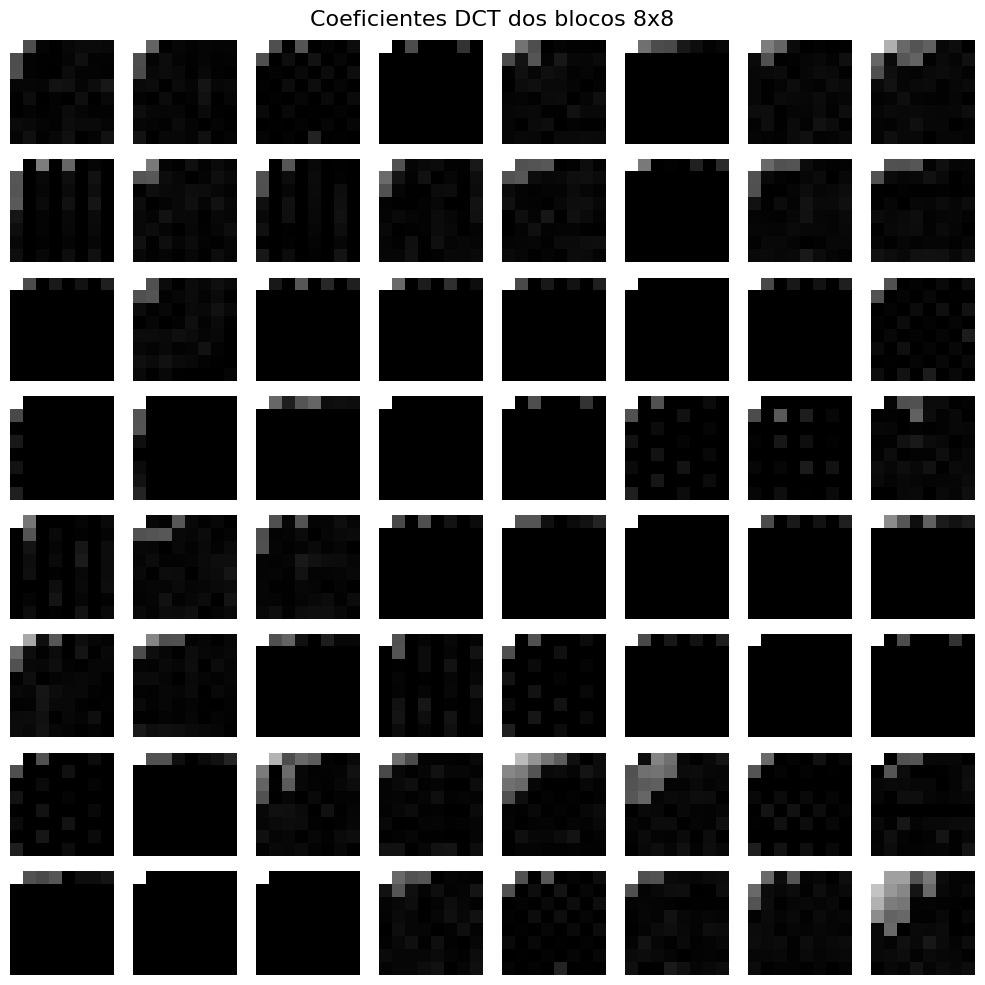

In [15]:
# Função para aplicar DCT 2D
def dct2(block):
    return dct(dct(block.T, norm='ortho').T, norm='ortho')

# Função para carregar a imagem e convertê-la em escala de cinza
def carregar_imagem(filename):
    imagem = Image.open(filename).convert('L')  # Convertendo para escala de cinza
    matriz_imagem = np.array(imagem)
    return matriz_imagem

# Função para dividir a imagem em blocos de NxN
def dividir_em_blocos(matriz_imagem, N):
    h, w = matriz_imagem.shape
    blocos = []
    for i in range(0, h, N):
        for j in range(0, w, N):
            bloco = matriz_imagem[i:i+N, j:j+N]
            blocos.append(bloco)
    return blocos

# Função para visualizar os coeficientes da DCT
def visualizar_dct(blocos_dct, N):
    fig, axs = plt.subplots(8, 8, figsize=(10, 10))
    for i in range(8):
        for j in range(8):
            bloco_dct = blocos_dct[i * 8 + j]  # Pegar o bloco correspondente
            axs[i, j].imshow(np.log(np.abs(bloco_dct) + 1), cmap='gray')  # Visualização logarítmica
            axs[i, j].axis('off')
    plt.suptitle(f'Coeficientes DCT dos blocos 8x8', fontsize=16)
    plt.tight_layout()
    plt.show()

# Parâmetros
N = 8  # Tamanho dos blocos 8x8

# Carregar a imagem
matriz_imagem = carregar_imagem('C:/Users/luanf/OneDrive/Documents/UECE_Mestrado/Processamento_Imagens/dct/lenna.jpg')  # Ajuste o caminho conforme necessário

# Dividir a imagem em blocos 8x8
blocos = dividir_em_blocos(matriz_imagem, N)

# Aplicar a DCT em cada bloco
blocos_dct = [dct2(bloco.astype(np.float32)) for bloco in blocos]

# Visualizar os coeficientes da DCT dos primeiros 64 blocos
visualizar_dct(blocos_dct, N)

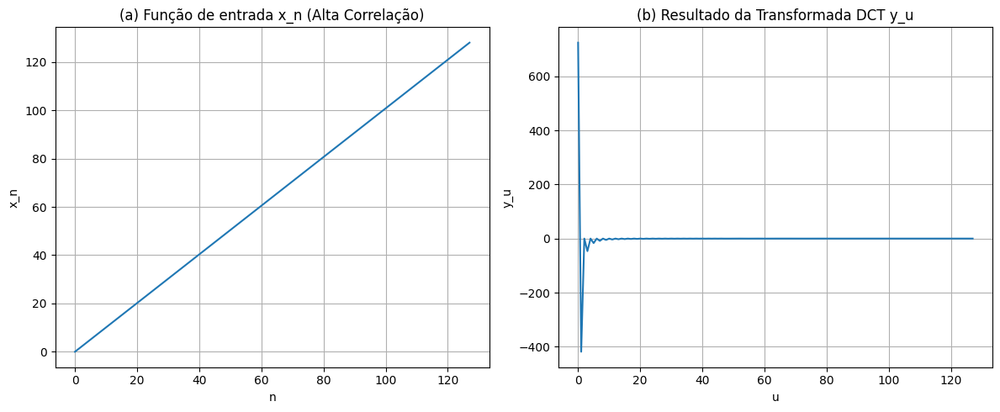

In [16]:
# Gerar um vetor de 128 componentes com alta correlação (um vetor linear)
N = 128
x_n = np.linspace(0, 128, N)

# Aplicar a DCT unidimensional
y_u = dct(x_n, norm='ortho')

# Visualizar os resultados
plt.figure(figsize=(12, 5))

# A - Função de entrada
plt.subplot(1, 2, 1)
plt.plot(np.arange(N), x_n)
plt.title('(a) Função de entrada x_n (Alta Correlação)')
plt.xlabel('n')
plt.ylabel('x_n')
plt.grid(True)

# B - Resultado da DCT
plt.subplot(1, 2, 2)
plt.plot(np.arange(N), y_u)
plt.title('(b) Resultado da Transformada DCT y_u')
plt.xlabel('u')
plt.ylabel('y_u')
plt.grid(True)

plt.tight_layout()
plt.show()

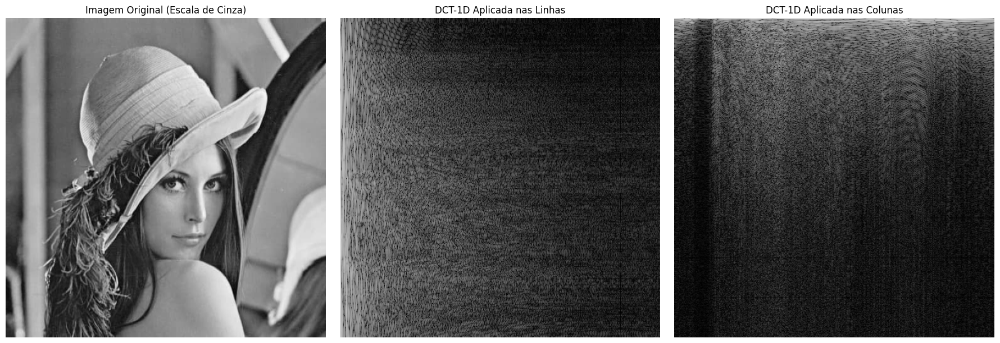

In [17]:
# Função para aplicar a DCT-1D em linhas ou colunas
def aplicar_dct_1d(imagem, eixo=0):
    dct_result = np.zeros_like(imagem, dtype=np.float32)
    if eixo == 0:  # Aplicar DCT nas linhas
        for i in range(imagem.shape[0]):
            dct_result[i, :] = dct(imagem[i, :], norm='ortho')
    elif eixo == 1:  # Aplicar DCT nas colunas
        for i in range(imagem.shape[1]):
            dct_result[:, i] = dct(imagem[:, i], norm='ortho')
    return dct_result

# Carregar a imagem "Lena" e convertê-la para escala de cinza
imagem_lena = Image.open('C:/Users/luanf/OneDrive/Documents/UECE_Mestrado/Processamento_Imagens/dct/lenna.jpg').convert('L')
imagem_lena = np.array(imagem_lena)

# Aplicar a DCT-1D nas linhas
dct_linhas = aplicar_dct_1d(imagem_lena, eixo=0)

# Aplicar a DCT-1D nas colunas
dct_colunas = aplicar_dct_1d(imagem_lena, eixo=1)

# Visualizar a imagem original, a DCT-1D aplicada nas linhas e a DCT-1D aplicada nas colunas
plt.figure(figsize=(18, 6))

# A - Imagem Original
plt.subplot(1, 3, 1)
plt.imshow(imagem_lena, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - DCT-1D aplicada nas Linhas
plt.subplot(1, 3, 2)
plt.imshow(np.log(np.abs(dct_linhas) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('DCT-1D Aplicada nas Linhas')
plt.axis('off')

# C - DCT-1D aplicada nas Colunas
plt.subplot(1, 3, 3)
plt.imshow(np.log(np.abs(dct_colunas) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('DCT-1D Aplicada nas Colunas')
plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
break

### Transformada Discreta de Seno - DST

Definir os dados de entrada

(512, 512)


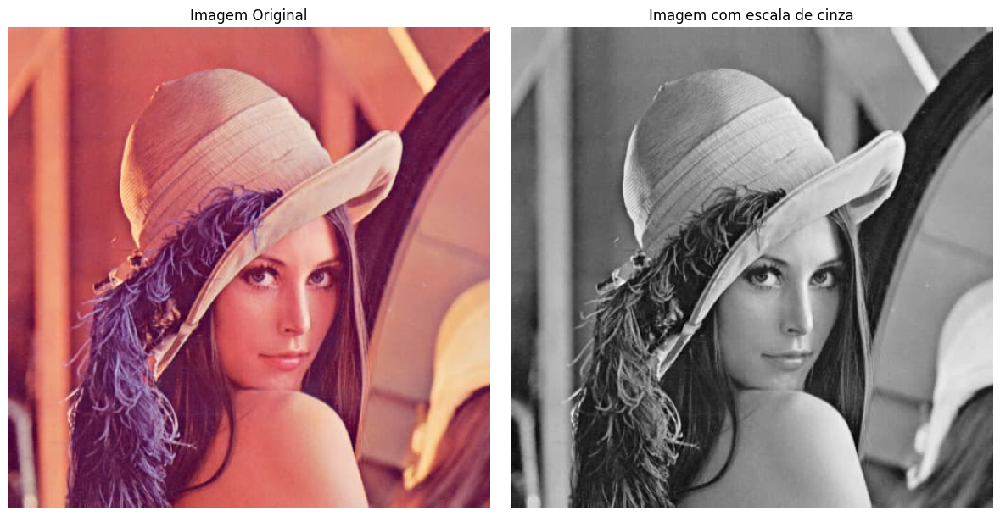

In [3]:
imagem_original = Image.open('lenna.jpg')
imagem_cinza = imagem_original.convert('L')
matriz_imagem = np.array(imagem_cinza)

print(matriz_imagem.shape)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(imagem_original, cmap='gray')
plt.title('Imagem Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(imagem_cinza, cmap='gray')
plt.title('Imagem com escala de cinza')
plt.axis('off')

plt.tight_layout()
plt.show()

Aplicar a DST

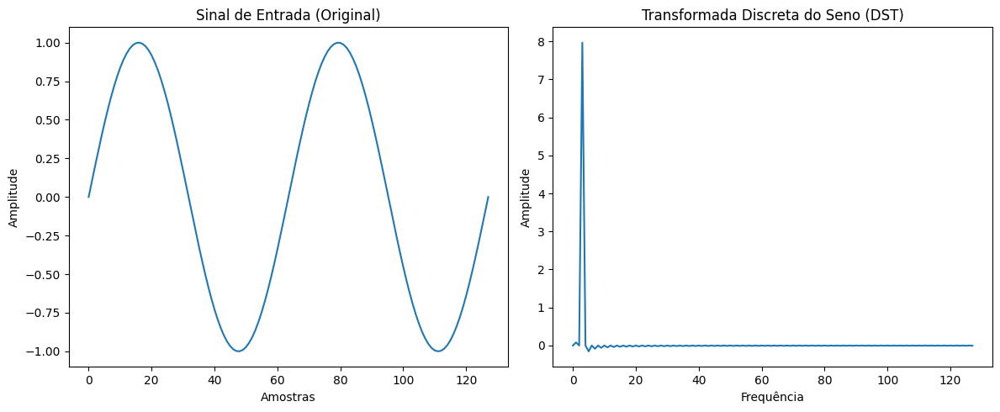

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import dst

# Gerar um sinal de exemplo (vetor)
N = 128
x = np.linspace(0, 4 * np.pi, N)
sinal = np.sin(x)  # Exemplo de sinal de entrada

# Aplicar a DST
dst_sinal = dst(sinal, type=2, norm='ortho')

# Visualizar o sinal original e a DST
plt.figure(figsize=(12, 5))

# Sinal original
plt.subplot(1, 2, 1)
plt.plot(sinal)
plt.title('Sinal de Entrada (Original)')
plt.xlabel('Amostras')
plt.ylabel('Amplitude')

# DST do sinal
plt.subplot(1, 2, 2)
plt.plot(dst_sinal)
plt.title('Transformada Discreta do Seno (DST)')
plt.xlabel('Frequência')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()


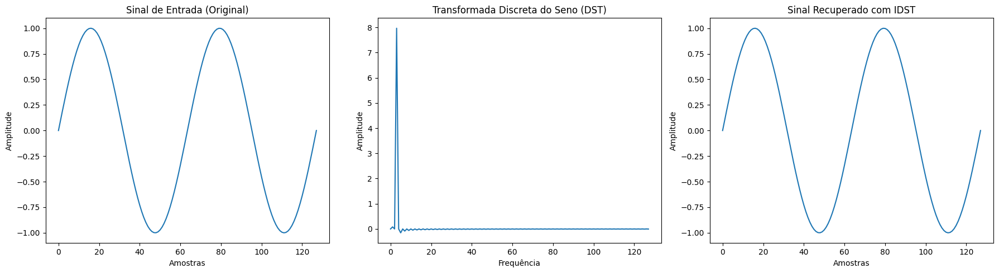

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import dst, idst

# Gerar um sinal de exemplo (vetor)
N = 128
x = np.linspace(0, 4 * np.pi, N)
sinal = np.sin(x)  # Exemplo de sinal de entrada

# Aplicar a DST
dst_sinal = dst(sinal, type=2, norm='ortho')

# Aplicar a IDST para recuperar o sinal original
idst_sinal = idst(dst_sinal, type=2, norm='ortho')

# Visualizar o sinal original, a DST e o sinal recuperado
plt.figure(figsize=(18, 5))

# Sinal original
plt.subplot(1, 3, 1)
plt.plot(sinal)
plt.title('Sinal de Entrada (Original)')
plt.xlabel('Amostras')
plt.ylabel('Amplitude')

# DST do sinal
plt.subplot(1, 3, 2)
plt.plot(dst_sinal)
plt.title('Transformada Discreta do Seno (DST)')
plt.xlabel('Frequência')
plt.ylabel('Amplitude')

# Sinal Recuperado com IDST
plt.subplot(1, 3, 3)
plt.plot(idst_sinal)
plt.title('Sinal Recuperado com IDST')
plt.xlabel('Amostras')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()

Visualizar ou interpretar os coeficientes da DST

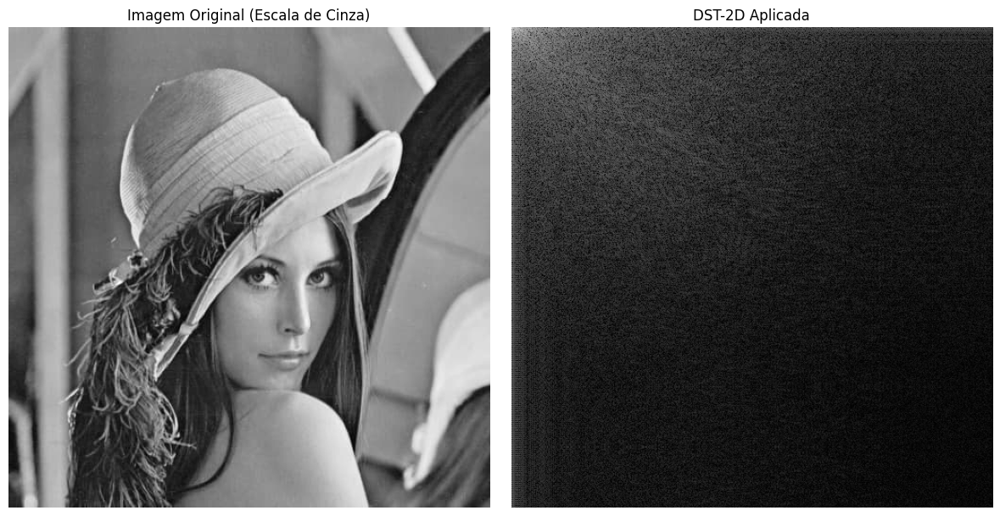

In [5]:
from scipy.fftpack import dst
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Função para aplicar a DST 2D (linha por linha e coluna por coluna)
def dst2(image):
    # Aplicar DST em cada linha
    temp = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[0]):
        temp[i, :] = dst(image[i, :], type=2, norm='ortho')
    
    # Aplicar DST em cada coluna
    dst_result = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[1]):
        dst_result[:, i] = dst(temp[:, i], type=2, norm='ortho')
    
    return dst_result

# Carregar a imagem em escala de cinza
imagem_lena = Image.open('C:/Users/luanf/OneDrive/Documents/UECE_Mestrado/Processamento_Imagens/dct/lenna.jpg').convert('L')
imagem_lena = np.array(imagem_lena)

# Aplicar a DST 2D
dst_imagem = dst2(imagem_lena)

# Visualizar a imagem original e a DST 2D
plt.figure(figsize=(12, 6))

# A - Imagem original
plt.subplot(1, 2, 1)
plt.imshow(imagem_lena, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - DST 2D aplicada
plt.subplot(1, 2, 2)
plt.imshow(np.log(np.abs(dst_imagem) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('DST-2D Aplicada')
plt.axis('off')

plt.tight_layout()
plt.show()


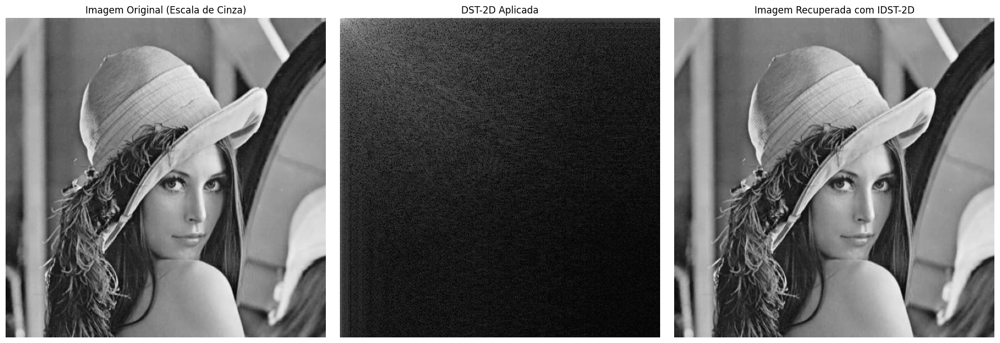

In [7]:
from scipy.fftpack import idst
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Função para aplicar a IDST 2D (linha por linha e coluna por coluna)
def idst2(image):
    # Aplicar IDST em cada coluna
    temp = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[1]):
        temp[:, i] = idst(image[:, i], type=2, norm='ortho')
    
    # Aplicar IDST em cada linha
    idst_result = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[0]):
        idst_result[i, :] = idst(temp[i, :], type=2, norm='ortho')
    
    return idst_result

# Carregar a imagem em escala de cinza
imagem_lena = Image.open('C:/Users/luanf/OneDrive/Documents/UECE_Mestrado/Processamento_Imagens/dct/lenna.jpg').convert('L')
imagem_lena = np.array(imagem_lena)

# Aplicar a DST 2D
def dst2(image):
    # Aplicar DST em cada linha
    temp = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[0]):
        temp[i, :] = dst(image[i, :], type=2, norm='ortho')
    
    # Aplicar DST em cada coluna
    dst_result = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[1]):
        dst_result[:, i] = dst(temp[:, i], type=2, norm='ortho')
    
    return dst_result

# Aplicar a DST 2D
dst_imagem = dst2(imagem_lena)

# Aplicar a IDST 2D para recuperar a imagem original
imagem_recuperada = idst2(dst_imagem)

# Visualizar a imagem original, a DST 2D e a imagem recuperada com IDST 2D
plt.figure(figsize=(18, 6))

# A - Imagem original
plt.subplot(1, 3, 1)
plt.imshow(imagem_lena, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - DST 2D aplicada
plt.subplot(1, 3, 2)
plt.imshow(np.log(np.abs(dst_imagem) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('DST-2D Aplicada')
plt.axis('off')

# C - Imagem Recuperada com IDST 2D
plt.subplot(1, 3, 3)
plt.imshow(imagem_recuperada, cmap='gray')
plt.title('Imagem Recuperada com IDST-2D')
plt.axis('off')

plt.tight_layout()
plt.show()


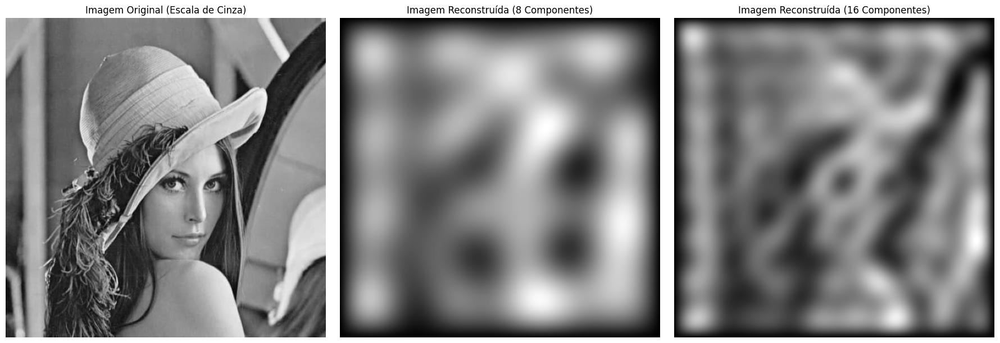

In [9]:
from scipy.fftpack import dst, idst
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Função para aplicar a DST 2D (linha por linha e coluna por coluna)
def dst2(image):
    # Aplicar DST em cada linha
    temp = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[0]):
        temp[i, :] = dst(image[i, :], type=2, norm='ortho')
    
    # Aplicar DST em cada coluna
    dst_result = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[1]):
        dst_result[:, i] = dst(temp[:, i], type=2, norm='ortho')
    
    return dst_result

# Função para aplicar a IDST 2D (linha por linha e coluna por coluna)
def idst2(image):
    # Aplicar IDST em cada coluna
    temp = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[1]):
        temp[:, i] = idst(image[:, i], type=2, norm='ortho')
    
    # Aplicar IDST em cada linha
    idst_result = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[0]):
        idst_result[i, :] = idst(temp[i, :], type=2, norm='ortho')
    
    return idst_result

# Função para truncar os coeficientes da DST para n componentes
def truncar_dct_para_n_componentes(dct_image, num_componentes):
    truncado = np.zeros_like(dct_image)
    truncado[:num_componentes, :num_componentes] = dct_image[:num_componentes, :num_componentes]
    return truncado

# Carregar a imagem em escala de cinza
imagem_lena = Image.open('C:/Users/luanf/OneDrive/Documents/UECE_Mestrado/Processamento_Imagens/dct/lenna.jpg').convert('L')
imagem_lena = np.array(imagem_lena)

# Aplicar a DST 2D
dst_imagem = dst2(imagem_lena)

# Truncar para 8 componentes
dst_truncado_8 = truncar_dct_para_n_componentes(dst_imagem, 8)

# Truncar para 16 componentes
dst_truncado_16 = truncar_dct_para_n_componentes(dst_imagem, 16)

# Aplicar a IDST 2D para recuperar a imagem original com truncagem
imagem_recuperada_8 = idst2(dst_truncado_8)
imagem_recuperada_16 = idst2(dst_truncado_16)

# Visualizar a imagem original e as imagens reconstruídas com 8 e 16 componentes
plt.figure(figsize=(18, 6))

# A - Imagem original
plt.subplot(1, 3, 1)
plt.imshow(imagem_lena, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - Imagem reconstruída com 8 componentes
plt.subplot(1, 3, 2)
plt.imshow(imagem_recuperada_8, cmap='gray')
plt.title('Imagem Reconstruída (8 Componentes)')
plt.axis('off')

# C - Imagem reconstruída com 16 componentes
plt.subplot(1, 3, 3)
plt.imshow(imagem_recuperada_16, cmap='gray')
plt.title('Imagem Reconstruída (16 Componentes)')
plt.axis('off')

plt.tight_layout()
plt.show()


In [11]:
imagem_lena = Image.open('C:/Users/luanf/OneDrive/Documents/UECE_Mestrado/Processamento_Imagens/dct/lena64.jpg').convert('L')
imagem_lena = np.array(imagem_lena)

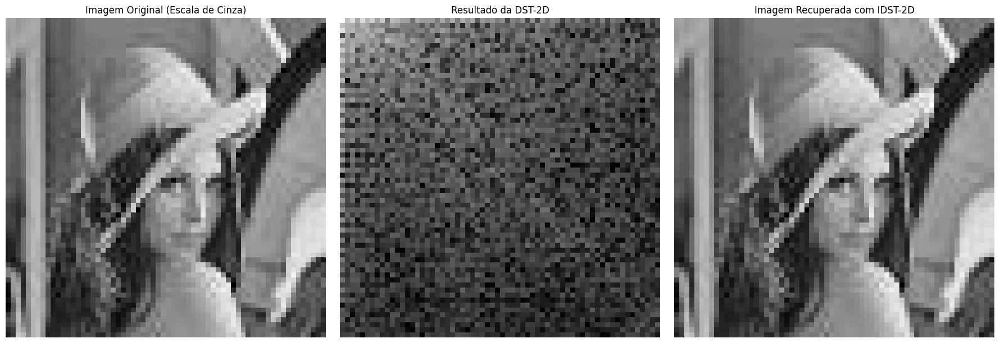

In [15]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Função para calcular a DST-2D
def dst2_manual(x):
    N = x.shape[0]  # Assumindo que a imagem é NxN
    y = np.zeros_like(x, dtype=float)
    factor = 2 / (N + 1)
    
    for u in range(N):
        for v in range(N):
            sum_val = 0
            for m in range(N):
                for n in range(N):
                    sum_val += x[m, n] * np.sin(np.pi * (m + 1) * (u + 1) / (N + 1)) * np.sin(np.pi * (n + 1) * (v + 1) / (N + 1))
            y[u, v] = factor * sum_val
    
    return y

# Função para calcular a IDST-2D
def idst2_manual(y):
    N = y.shape[0]  # Assumindo que a imagem é NxN
    x = np.zeros_like(y, dtype=float)
    factor = 2 / (N + 1)
    
    for m in range(N):
        for n in range(N):
            sum_val = 0
            for u in range(N):
                for v in range(N):
                    sum_val += y[u, v] * np.sin(np.pi * (m + 1) * (u + 1) / (N + 1)) * np.sin(np.pi * (n + 1) * (v + 1) / (N + 1))
            x[m, n] = factor * sum_val
    
    return x

# Carregar a imagem da Lena e convertê-la para escala de cinza
imagem_lena = Image.open('C:/Users/luanf/OneDrive/Documents/UECE_Mestrado/Processamento_Imagens/dct/lena64.jpg').convert('L')
imagem_lena = np.array(imagem_lena)

# Verificar as dimensões da imagem e ajustar se necessário
N = imagem_lena.shape[0]
if imagem_lena.shape[0] != imagem_lena.shape[1]:
    raise ValueError("A imagem precisa ser NxN para essa implementação.")

# Aplicar a DST-2D manual
dst_imagem = dst2_manual(imagem_lena)

# Aplicar a IDST-2D manual para recuperar a imagem original
imagem_recuperada = idst2_manual(dst_imagem)

# Visualizar a imagem original, a DST-2D e a imagem recuperada
plt.figure(figsize=(18, 6))

# A - Imagem original
plt.subplot(1, 3, 1)
plt.imshow(imagem_lena, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - Resultado da DST-2D
plt.subplot(1, 3, 2)
plt.imshow(np.log(np.abs(dst_imagem) + 1), cmap='gray')  # Escala logarítmica para visualizar a DST
plt.title('Resultado da DST-2D')
plt.axis('off')

# C - Imagem recuperada com IDST-2D
plt.subplot(1, 3, 3)
plt.imshow(imagem_recuperada, cmap='gray')
plt.title('Imagem Recuperada com IDST-2D')
plt.axis('off')

plt.tight_layout()
plt.show()
